In [1]:
from pathlib import Path
import torch
from torch import nn
from torch.nn import functional as nnf
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import dvs
from dvs import plots
%load_ext autoreload
%autoreload 2
mpl.rcParams['figure.dpi'] = 200
assert mpl.rcParams['font.family'][0] == 'sans-serif' and mpl.rcParams['font.sans-serif'][0] == 'Arial'

In [2]:
ensemble = dvs.analysis.EnsembleViews("flow/0092")

In [3]:
validation_subwrap = "original_validation_v2"
validation_loss_fn = "epe"

movingedge_subwrap = f"{validation_subwrap}/{validation_loss_fn}_based/moving_edges"
flash_subwrap = f"{validation_subwrap}/{validation_loss_fn}_based/flashes"

naturalistic_responses_wrap = "naturalistic_responses_v3"
naturalistic_responses_wrap = (
    f"{validation_subwrap}/{validation_loss_fn}_based/{naturalistic_responses_wrap}"
)

In [4]:
directory = dvs.figure_03_naturalistic_stimuli_responses
directory.mkdir(exist_ok=True, parents=True)

In [5]:
# verify model 0 is model 0
np.argsort(ensemble.task_error(validation_subwrap=validation_subwrap,
                               loss_name=validation_loss_fn).values)

array([ 0,  1,  2,  3, 17,  6,  4, 31,  5,  7, 12, 39, 14, 13, 29, 41, 26,
       24, 32, 20, 30, 15, 16, 10, 11,  9,  8, 23, 36, 25, 22, 33, 34, 19,
       35, 21, 28, 18, 27, 42, 40, 43, 37, 46, 45, 38, 47, 44, 48, 49])

# a - connectome, single-cell-dynamics, and task constraint models to predict neural tuning

## connectome constraints

## task error histogram

In [6]:
average_min_lower_error = 4.814054543321783
average_min_upper_error = 5.692145279943943
normalize = True


In [7]:
# task error on the original held out validation set, but with average end-point error
with ensemble.sort(
    "min", validation_subwrap=validation_subwrap, loss_name=validation_loss_fn
):
    task_error = ensemble.task_error(
        validation_subwrap=validation_subwrap,
        normalize=normalize,
        loss_name=validation_loss_fn,
        lower_error_bound=average_min_lower_error,
        upper_error_bound=average_min_upper_error
    )

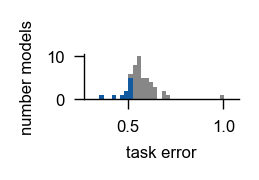

In [89]:
values, edges = np.histogram(task_error.values[: int(0.2 * len(task_error.values))])

width = (edges[1:] - edges[:-1])[0]


fig, ax = dvs.plots.init_plot(figsize=[1.0, 0.3], fontsize=6)
bins = np.linspace(*dvs.plots.get_lims(task_error.values, 0.1), 35)
ax.hist(task_error.values, color=(0.53, 0.53, 0.53, 1.0), bins=bins)
_, _, patches = ax.hist(
    task_error.values[: int(0.2 * len(task_error.values))], color="orange", bins=bins
)

for i, p in enumerate(patches):
    p.set_facecolor(
        np.mean(task_error.colors[: int(0.2 * len(task_error.values))], axis=0)
    )

ax.set_xlabel("task error", fontsize=6)
ax.set_ylabel("number models", fontsize=6)
# ax.vlines(0, *ax.get_ylim(), ls="-.")
# ax.vlines(1, *ax.get_ylim(), ls="-.")

# fig, cbar = dvs.plots.standalone_colorbar(cmap, norm, label='task error', figsize=[0.05, 0.75], fontsize=5,
#                                           ticks=[0.0, 0.5, 1.0],
#                                           tick_width=0.25, tick_length=1)
# plt.savefig(DIR.parent / f"task_error_cbar_vertical.pdf", bbox_inches="tight", transparent=True)

plt.savefig(directory / "task_error_histogram_with_normalization.pdf", bbox_inches="tight", transparent=True)

In [34]:
average_min_lower_error = None
average_min_upper_error = None
normalize = False

In [35]:
# task error on the original held out validation set, but with average end-point error
with ensemble.sort(
    "min", validation_subwrap=validation_subwrap, loss_name=validation_loss_fn
):
    task_error = ensemble.task_error(
        validation_subwrap=validation_subwrap,
        normalize=normalize,
        loss_name=validation_loss_fn,
        lower_error_bound=average_min_lower_error,
        upper_error_bound=average_min_upper_error
    )

In [40]:
bins = np.linspace(*dvs.plots.get_lims(task_error.values, 0.1), 35)


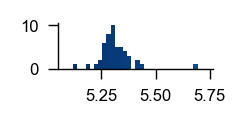

In [49]:
fig, ax = dvs.plots.init_plot(figsize=[1.0, 0.3], fontsize=6)
bins = np.linspace(*dvs.plots.get_lims(task_error.values, 0.1), 35)
_, _, patches = ax.hist(task_error.values, bins=bins)
for i, p in enumerate(patches):
    p.set_facecolor(
        task_error.cmap(i)
    )

In [56]:
task_error.cmap.N

256

In [9]:
mpl.rcParams['figure.dpi'] = 200

Text(0, 0.5, 'number models')

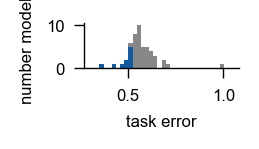

In [13]:
fig, ax = dvs.plots.init_plot(figsize=[1.0, 0.3], fontsize=6)
bins = np.linspace(*dvs.plots.get_lims(task_error.values, 0.1), 35)
ax.hist(task_error.values, color=(0.53, 0.53, 0.53, 1.0), bins=bins)
_, _, patches = ax.hist(
    task_error.values[: int(0.2 * len(task_error.values))], color="orange", bins=bins
)

for i, p in enumerate(patches):
    p.set_facecolor(
        np.mean(task_error.colors[: int(0.2 * len(task_error.values))], axis=0)
    )

ax.set_xlabel("task error", fontsize=6)
ax.set_ylabel("number models", fontsize=6)

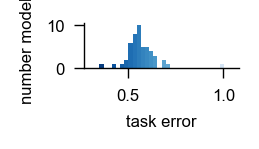

In [16]:
fig, ax = dvs.plots.init_plot(figsize=[1.0, 0.3], fontsize=6)
bins = np.linspace(*dvs.plots.get_lims(task_error.values, 0.1), 35)
_, _, patches = ax.hist(task_error.values, bins=bins)
for i, p in enumerate(patches):
    color = task_error.cmap(i/len(patches))
    p.set_facecolor(
        color
    )
ax.set_ylabel("number models", fontsize=6)    
ax.set_xlabel("task error", fontsize=6)
plt.savefig(directory / "task_error_histogram_without_normalization.pdf",transparent=True, pad_inches=0.1)

Text(0, 0.5, 'number models')

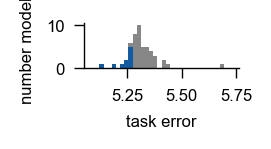

In [68]:
values, edges = np.histogram(task_error.values[: int(0.2 * len(task_error.values))])

width = (edges[1:] - edges[:-1])[0]


fig, ax = dvs.plots.init_plot(figsize=[1.0, 0.3], fontsize=6)
bins = np.linspace(*dvs.plots.get_lims(task_error.values, 0.1), 35)
ax.hist(task_error.values, color=(0.53, 0.53, 0.53, 1.0), bins=bins)
_, _, patches = ax.hist(
    task_error.values[: int(0.2 * len(task_error.values))], color="orange", bins=bins
)

for i, p in enumerate(patches):
    p.set_facecolor(
        np.mean(task_error.colors[: int(0.2 * len(task_error.values))], axis=0)
    )

ax.set_xlabel("task error", fontsize=6)
ax.set_ylabel("number models", fontsize=6)
# ax.vlines(0, *ax.get_ylim(), ls="-.")
# ax.vlines(1, *ax.get_ylim(), ls="-.")

# fig, cbar = dvs.plots.standalone_colorbar(cmap, norm, label='task error', figsize=[0.05, 0.75], fontsize=5,
#                                           ticks=[0.0, 0.5, 1.0],
#                                           tick_width=0.25, tick_length=1)
# plt.savefig(DIR.parent / f"task_error_cbar_vertical.pdf", bbox_inches="tight", transparent=True)

# plt.savefig(directory / "task_error_histogram_without_normalization.pdf", bbox_inches="tight", transparent=True)

## simple stimuli

In [8]:
nnv = ensemble[0]

In [9]:
nnv.init_movingbar(movingedge_subwrap)

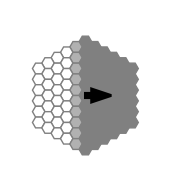

In [10]:
angle = 0
dx, dy = np.exp(np.radians(angle) * 1j).real, np.exp(np.radians(angle) * 1j).imag
fig, ax, _ = dvs.plots.quick_hex_scatter(nnv.movingbar.get(angle=angle, 
                                                           width=80, 
                                                           speed=19.0, 
                                                           intensity=1).cpu().numpy()[230], 
                                         vmin=0, vmax=1, cbar=False, figsize=[1, 1], max_extent=5,
                                        edgecolor="0.5")
plt.arrow(0, 0, dx, dy, color='black', width=0.7)
# plt.savefig(dvs.figure_dir / DIR / "movingbar_f2b_on_cartoon.pdf", bbox_inches="tight", transparent=True)

### responses to simple stimuli

In [21]:
ensemble.init_movingbar(subwrap=movingedge_subwrap)

In [17]:
model_responses = []

for nnv in ensemble.values():
    model_responses.append(nnv.movingbar.response("T4a", speed=13, width=80, intensity=1, angle=[60]))
    model_responses.append(nnv.movingbar.response("T4b", speed=13, width=80, intensity=1, angle=[60]))
    model_responses.append(nnv.movingbar.response("T4c", speed=13, width=80, intensity=1, angle=[60]))
    model_responses.append(nnv.movingbar.response("T4d", speed=13, width=80, intensity=1, angle=[60]))
    model_responses.append(nnv.movingbar.response("T5a", speed=13, width=80, intensity=0, angle=[60]))
    model_responses.append(nnv.movingbar.response("T5b", speed=13, width=80, intensity=0, angle=[60]))
    model_responses.append(nnv.movingbar.response("T5c", speed=13, width=80, intensity=0, angle=[60]))
    model_responses.append(nnv.movingbar.response("T5d", speed=13, width=80, intensity=0, angle=[60]))


model_responses = np.array(model_responses)
model_responses= model_responses.reshape(model_responses.shape[0], 1, model_responses.shape[-1])

In [18]:
model_responses = (model_responses - np.nanmean(model_responses, axis=2, keepdims=True)) / np.nanstd(model_responses, axis=2, keepdims=True)

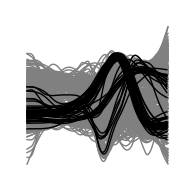

In [19]:
fig, ax = dvs.plots.init_plot(figsize=[1, 1], fontsize=6)
dvs.plots.rm_spines(ax)
for i in range(model_responses.shape[1]):
    resp = model_responses[:, i]
    _ = ax.plot(resp.T, '0.5', lw=0.5, zorder=0)
    _ = ax.plot(resp[2::8].T, 'k', lw=0.5, zorder=1)
plt.savefig(directory / f"synthetic_stimuli_response_schematic.pdf", bbox_inches="tight", transparent=True)

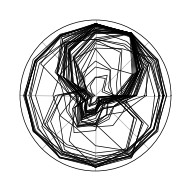

In [23]:
colors = np.array([0, 0, 0, 1]).repeat(50).reshape(4, 50).T
fig, ax = ensemble.motion_tuning(
    "T4c",
    legend=False,
    colors=colors,
    figsize=[1, 1],
    linewidth=0.25,
    zorder=100,
    alpha=1,
    subwrap=movingedge_subwrap
)
ax.set_xticklabels([])
ax.set_yticklabels([])
plt.setp(ax.spines.values(), color="k", linewidth=0.25)
ax.grid(True, linewidth=0.25, zorder=0)
plt.savefig(directory / f"synthetic_stimuli_response_tuning_mixed.pdf", bbox_inches="tight", transparent=True)

### statistics of responses to simple stimuli

In [24]:
movingedge_subwrap

'original_validation_v2/epe_based/moving_edges'

In [25]:
ensemble._initialized["movingbar"] = ""

In [26]:
ensemble.init_movingbar(movingedge_subwrap)

In [27]:
with ensemble.model_ratio(best=0.2):
    dsis, node_types = ensemble.dsis(subwrap=movingedge_subwrap, intensity=1)

In [28]:
indices = [
    i
    for i, nt in enumerate(node_types)
    if nt in ["T4a", "T4b", "T4c", "T4d", "T5a", "T5b", "T5c", "T5d"]
]

In [29]:
dsis = dsis[:, indices]
node_types = node_types[indices]

(<Figure size 200x200 with 1 Axes>,
 <AxesSubplot:>,
 array([[0.        , 0.26666667, 0.10588235, 1.        ]]))

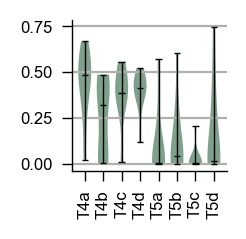

In [30]:
ensemble.dsi_violins(subwrap=movingedge_subwrap, 
                     dsis=dsis, 
                     node_types=["T4a", "T4b", "T4c", "T4d", "T5a", "T5b", "T5c", "T5d"],
                     figsize=[1, 1])

## naturalistic stimuli

In [31]:
ensemble.init_augmented_sintel(dt=1/100)

In [32]:
nnv = ensemble[0]

In [34]:
nnv.augmented_sintel.dt = 1/100

In [35]:
stimulus = nnv.augmented_sintel.get(sequence=1, flip_ax='None', n_rot=0)

In [36]:
stimulus = stimulus[~torch.isnan(stimulus).any(axis=1)].cpu().numpy()

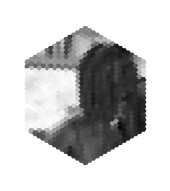

In [37]:
dvs.plots.quick_hex_scatter(stimulus[0], figsize=[1, 1], cbar=False, vmin=0, vmax=1, frame=False)

plt.savefig(directory / f"natural_stimuli_schematic.pdf", bbox_inches="tight", transparent=True)

### responses to naturalistic stimuli

In [ ]:
model_responses = []

for nnv in ensemble.values():
    model_responses.append(nnv.augmented_sintel.response("T4c", sequence=1, flip_ax=0, n_rot=0)[int(0.25/(1/100)):])
    
model_responses = np.array(model_responses)

In [ ]:
model_responses = (model_responses - np.nanmean(model_responses, axis=1, keepdims=True)) / np.nanstd(model_responses, axis=1, keepdims=True)

In [ ]:
fig, ax = dvs.plots.init_plot(figsize=[1, 1], fontsize=6)
dvs.plots.rm_spines(ax)
ax.plot(model_responses.T, 'k', lw=0.5)
# ax.set_ylabel('responses', fontsize=6, labelpad=-6)
# ax.set_xlabel('time', fontsize=6, labelpad=-6)
plt.savefig(directory  / f"natural_stimuli_response_schematic.pdf", bbox_inches="tight", transparent=True)

### umap and cluster models

In [ ]:
cluster_responses = {i: [] for i in clusters}

for i, model_indices in clusters.items():
    for model_index in model_indices:
        nnv = ensemble[model_index]
        cluster_responses[i].append(nnv.augmented_sintel.response("T4c", sequence=1, flip_ax=0, n_rot=0)[int(0.25/(1/100)):])
    model_responses = np.array(cluster_responses[i])
    model_responses = (model_responses - np.nanmean(model_responses, axis=1, keepdims=True)) / np.nanstd(model_responses, axis=1, keepdims=True)
    cluster_responses[i] = model_responses

In [ ]:
x, y = [0, 0.5, 1], [1, 0.1, 1]
fig, axes, _ = dvs.plots.regular_ax_scatter(x, y, figsize=[1, 1])
[dvs.plots.rm_spines(ax) for ax in axes]

for i in range(len(clusters)):
    model_responses = cluster_responses[i]
    axes[i].plot(model_responses.T, lw=0.5, color='k')
#     ax.set_ylabel('responses', fontsize=6, labelpad=-6)
#     ax.set_xlabel('time', fontsize=6, labelpad=-6)

label_axes = fig.add_axes([0, 0, 1, 1])
# label_axes.set_ylabel('responses', fontsize=6, labelpad=-12)
dvs.plots.rm_spines(label_axes)
# label_axes.set_xlabel('time', fontsize=6, labelpad=-12)
plt.savefig(directory  / f"natural_stimuli_response_clustered_schematic.pdf", bbox_inches="tight", transparent=True)

## within cell-type correlations - all models (no averaging for optional across cell-type correlations)

Simulating responses to naturalistic stimuli for all $M$ models, we get the synthetic recordings of voltage simulations 

$$V\in \mathbb{R}^{M\cdot CxN\cdot T}$$


- $M=50$ models
- $C=65$ cell types
- $N=1656$ stimuli
- $T=205$ timesteps (2.05s)

We compute correlations between the $MxC$ cell simulations

$$R \in \mathbb{R}^{M\cdot C x M\cdot C}\quad \mathrm{with}\,\,r_{ij} = \frac{Cov(V_i, V_j)}{\sqrt{Var(V_i)Var(V_j)}}$$. 

I.e. $C\cdot C$ correlation matrices of size $MxM$ or $M\cdot M$ correlation matrices of size $CxC$.

We can sort the matrices along the model dimension $M$ according descending in task-performance.

In [7]:
from dvs.utils import delete_stale_ipython_variables_of_type, ipython_variables_of_type

In [382]:
delete_stale_ipython_variables_of_type(globals())

In [8]:
ensemble.init_naturalistic_responses(subwrap=naturalistic_responses_wrap)

In [9]:
ensemble._initialized["naturalistic_responses"]

'original_validation_v2/epe_based/naturalistic_responses_v3'

In [12]:
responses = ensemble.naturalistic_responses[:]

In [14]:
# 50 models, 4526 stimuli samples, 80 frames, 65 cell types
responses.shape

(50, 4536, 80, 65)

In [16]:
# move cell types to second dim to concatenate with models and samples with frames
# 50 models, 65 cell types 80 frames, 4536 stimuli samples
responses = np.transpose(responses, axes=(0, 3, 1, 2))

In [17]:
X = torch.FloatTensor(responses).reshape(50 * 65, -1)

In [105]:
correlations = torch.corrcoef(X)

In [106]:
correlations = correlations.reshape(50, 65, 50, 65)

In [120]:
# correlations = correlations[best_index, :][:, :, best_index]

### all correlation matrices plot

In [20]:
cell_indices = np.arange(len(ensemble.node_types))

In [21]:
ax_matrix = np.arange(1., len(cell_indices) * len(cell_indices) + 1).reshape(len(cell_indices), len(cell_indices))
ax_matrix = np.triu(ax_matrix)
ax_matrix[np.where(ax_matrix == 0)] = np.nan

In [22]:
from matplotlib.axes import Axes

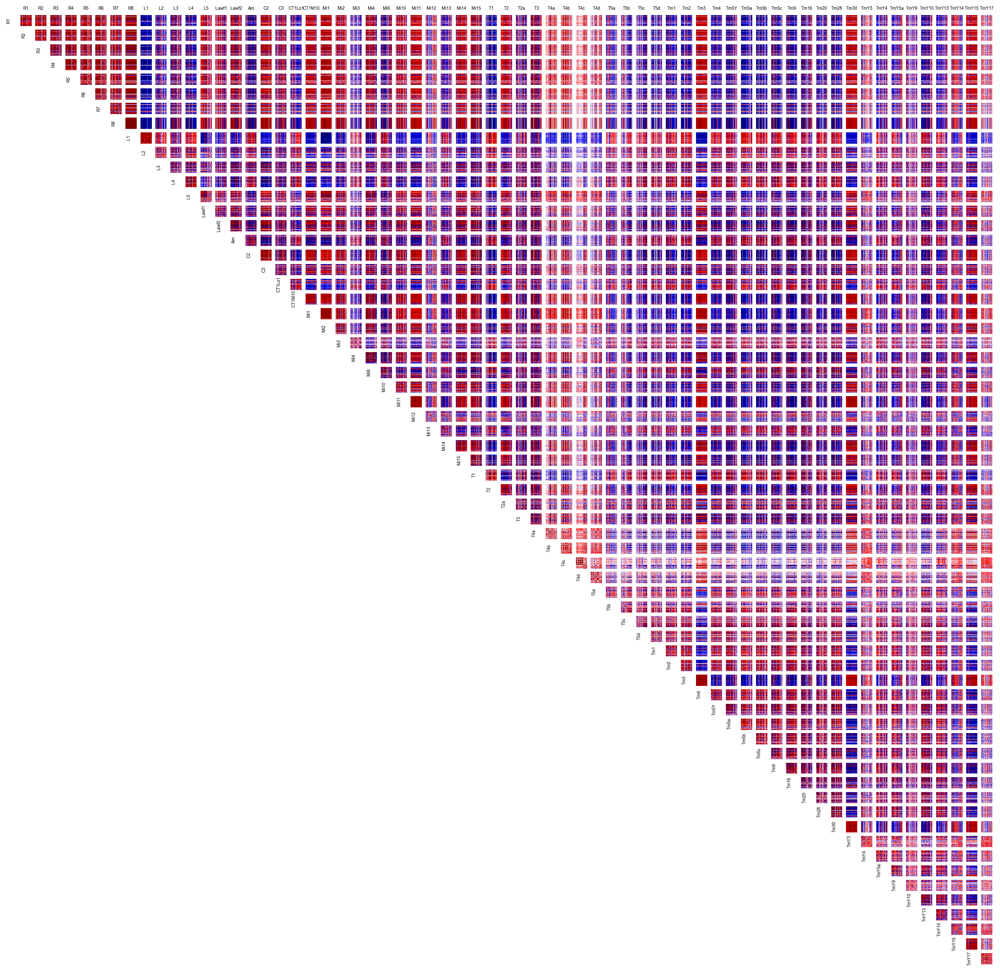

In [23]:
fig, axes = dvs.plots.divide_figure_to_grid(ax_matrix, as_matrix=True, reshape_order="special", figsize=[20, 20])

for ax in axes.flatten():
    if isinstance(ax, Axes):
        dvs.plots.rm_spines(ax)

vmin, vmax = correlations.min().item(), correlations.max().item()

for i, row_index in enumerate(cell_indices):
    for column_index in cell_indices[i:]:
        axes[row_index, column_index].imshow(correlations[:, row_index, :, column_index].cpu().numpy(), 
                                             cmap=plt.cm.seismic, 
                                             vmin=vmin, 
                                             vmax=vmax)
        if row_index == 0:
            axes[row_index, column_index].set_title(ensemble.node_types[column_index], fontsize=5)
        if column_index == row_index:
            axes[row_index, column_index].set_ylabel(ensemble.node_types[row_index], fontsize=5)
            
# observation: R8 seems to be coupled to           

### comic correlation matrix plot for flowchart

In [21]:
node_indexer = dvs.utils.NodeIndexer(ensemble.ctome)

In [77]:
subset = ["Mi4"]
subset_indices = node_indexer[subset]

In [78]:
cell_indices = np.arange(len(subset_indices))

In [79]:
ax_matrix = np.arange(1., len(subset_indices) * len(subset_indices) + 1).reshape(len(subset_indices), len(subset_indices))
ax_matrix = np.triu(ax_matrix)
ax_matrix[np.where(ax_matrix == 0)] = np.nan

In [80]:
from matplotlib.axes import Axes

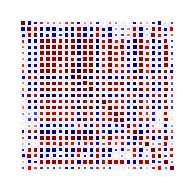

In [98]:
fig, axes = dvs.plots.divide_figure_to_grid(ax_matrix, as_matrix=True, reshape_order="special", figsize=[1, 1])

for ax in axes.flatten():
    if isinstance(ax, Axes):
        dvs.plots.rm_spines(ax)

subset_model_indices = np.arange(25, 50)
subset_correlations = correlations[:, subset_indices][:, :, :, subset_indices]  #
subset_correlations = subset_correlations[subset_model_indices][:, :, subset_model_indices]
vmin, vmax = -1, 1 #correlations.min().item(), correlations.max().item()

for i, row_index in enumerate(cell_indices):
    for column_index in cell_indices[i:]:
        
        ax=axes[row_index, column_index]
        dvs.plots.heatmap(subset_correlations[:, row_index, :, column_index].cpu().numpy(),
                          xlabels=[],
                          cmap=plt.cm.seismic, 
                         vmin=vmin, 
                         vmax=vmax,
                          fig=fig,
                          ax=ax,
                          cbar=False,
                          size_scale=2,
                          grid_linewidth=0.1,
                     )
#         axes[row_index, column_index].imshow(subset_correlations[:, row_index, :, column_index].cpu().numpy(), 
#                                              cmap=plt.cm.seismic, 
#                                              vmin=vmin, 
#                                              vmax=vmax)
#         if row_index == 0:
#             axes[row_index, column_index].set_title(subset[column_index], fontsize=8)
#         if column_index == row_index:
#             axes[row_index, column_index].set_ylabel(subset[row_index], fontsize=8)

# norm = dvs.plots.get_norm(vmin=vmin, vmax=vmax)
# dvs.plots.add_colorbar_to_fig(plt.gcf(), cmap=plt.cm.seismic, norm=norm, width=0.01, fontsize=8, label='correlation')

plt.savefig(
    directory / f"comic_correlation_matrix.pdf",
    bbox_inches="tight",
    transparent=True,
)

### T4 T5 correlation matrices plot

In [21]:
node_indexer = dvs.utils.NodeIndexer(ensemble.ctome)

In [22]:
subset = ["T4a", "T4b", "T4c", "T4d", "T5a", "T5b", "T5c", "T5d"]
subset_indices = node_indexer[subset]

In [23]:
cell_indices = np.arange(len(subset_indices))

In [24]:
ax_matrix = np.arange(1., len(subset_indices) * len(subset_indices) + 1).reshape(len(subset_indices), len(subset_indices))
ax_matrix = np.triu(ax_matrix)
ax_matrix[np.where(ax_matrix == 0)] = np.nan

In [25]:
from matplotlib.axes import Axes

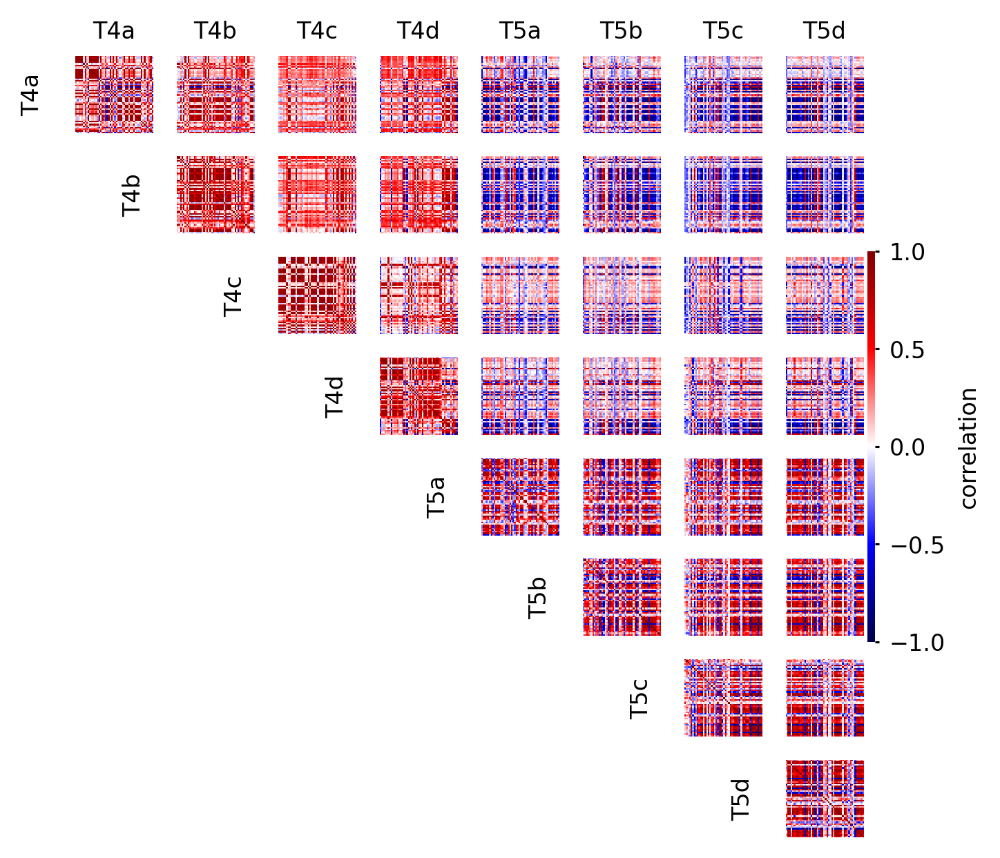

In [26]:
fig, axes = dvs.plots.divide_figure_to_grid(
    ax_matrix, as_matrix=True, reshape_order="special", figsize=[5, 5]
)

for ax in axes.flatten():
    if isinstance(ax, Axes):
        dvs.plots.rm_spines(ax)

subset_correlations = correlations[:, subset_indices][:, :, :, subset_indices]  #
vmin, vmax = -1, 1  # correlations.min().item(), correlations.max().item()

for i, row_index in enumerate(cell_indices):
    for column_index in cell_indices[i:]:

        axes[row_index, column_index].imshow(
            subset_correlations[:, row_index, :, column_index].cpu().numpy(),
            cmap=plt.cm.seismic,
            vmin=vmin,
            vmax=vmax,
        )
        if row_index == 0:
            axes[row_index, column_index].set_title(subset[column_index], fontsize=8)
        if column_index == row_index:
            axes[row_index, column_index].set_ylabel(subset[row_index], fontsize=8)

norm = dvs.plots.get_norm(vmin=vmin, vmax=vmax)
dvs.plots.add_colorbar_to_fig(
    plt.gcf(),
    cmap=plt.cm.seismic,
    norm=norm,
    width=0.01,
    fontsize=8,
    label="correlation",
)
# observation: R8 seems to be coupled to

### T4 T5 inputs correlation matrices plot

In [24]:
node_indexer = dvs.utils.NodeIndexer(ensemble.ctome)

In [25]:
subset = [
#     "L2",
#     "L3",
#     "L4",
    "Tm1",
    "Tm2",
    "Tm4",
    "Tm9",
    "CT1Lo1",
#     "L1",
#     "L3",
#     "L5",
    "Mi1",
    "Tm3",
    "Mi4",
    "Mi9",
    "CT1M10",
]
subset_indices = node_indexer[subset]

In [26]:
cell_indices = np.arange(len(subset_indices))

In [27]:
ax_matrix = np.arange(1., len(subset_indices) * len(subset_indices) + 1).reshape(len(subset_indices), len(subset_indices))
ax_matrix = np.triu(ax_matrix)
ax_matrix[np.where(ax_matrix == 0)] = np.nan

In [28]:
from matplotlib.axes import Axes

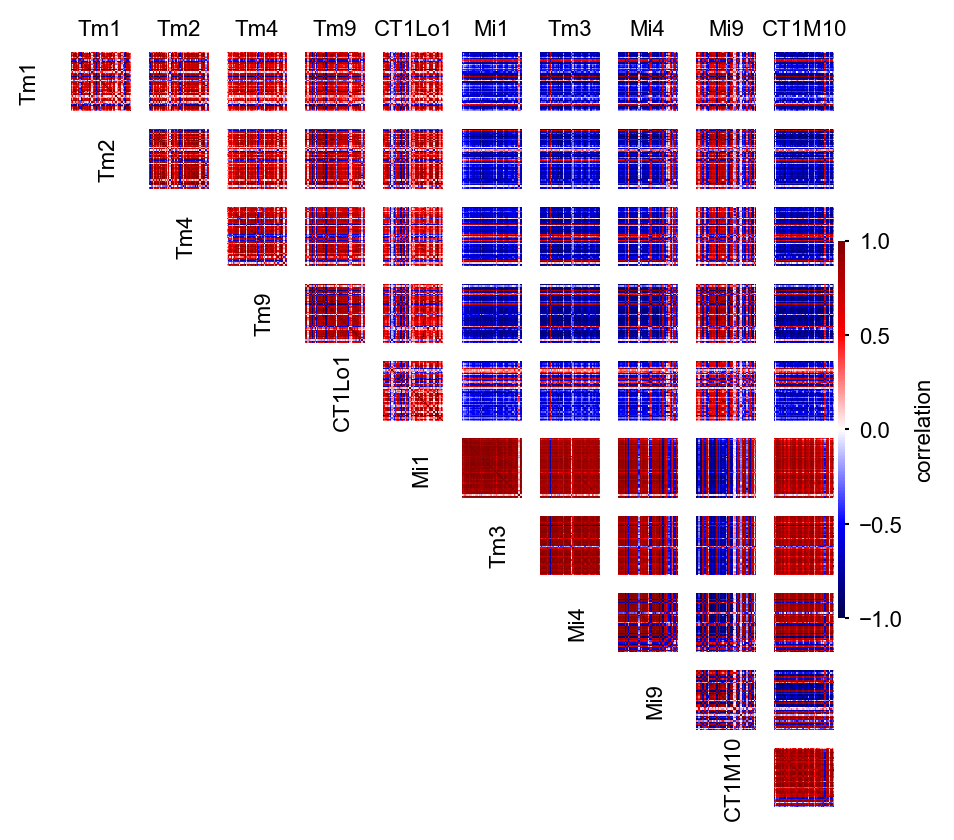

In [29]:
fig, axes = dvs.plots.divide_figure_to_grid(ax_matrix, as_matrix=True, reshape_order="special", figsize=[5, 5])

for ax in axes.flatten():
    if isinstance(ax, Axes):
        dvs.plots.rm_spines(ax)

subset_correlations = correlations[:, subset_indices][:, :, :, subset_indices]  #
vmin, vmax = -1, 1 #correlations.min().item(), correlations.max().item()

for i, row_index in enumerate(cell_indices):
    for column_index in cell_indices[i:]:
        
        axes[row_index, column_index].imshow(subset_correlations[:, row_index, :, column_index].cpu().numpy(), 
                                             cmap=plt.cm.seismic, 
                                             vmin=vmin, 
                                             vmax=vmax)
        if row_index == 0:
            axes[row_index, column_index].set_title(subset[column_index], fontsize=8)
        if column_index == row_index:
            axes[row_index, column_index].set_ylabel(subset[row_index], fontsize=8)

norm = dvs.plots.get_norm(vmin=vmin, vmax=vmax)
dvs.plots.add_colorbar_to_fig(plt.gcf(), cmap=plt.cm.seismic, norm=norm, width=0.01, fontsize=8, label='correlation')
# observation: R8 seems to be coupled to             

### output cell type correlation matrices plot

In [27]:
node_indexer = dvs.utils.NodeIndexer(ensemble.ctome)

In [29]:
subset = ensemble.ctome.output_node_types[:].astype(str)
subset_indices = node_indexer[subset]

In [30]:
cell_indices = np.arange(len(subset_indices))

In [31]:
ax_matrix = np.arange(1., len(subset_indices) * len(subset_indices) + 1).reshape(len(subset_indices), len(subset_indices))
ax_matrix = np.triu(ax_matrix)
ax_matrix[np.where(ax_matrix == 0)] = np.nan

In [32]:
from matplotlib.axes import Axes

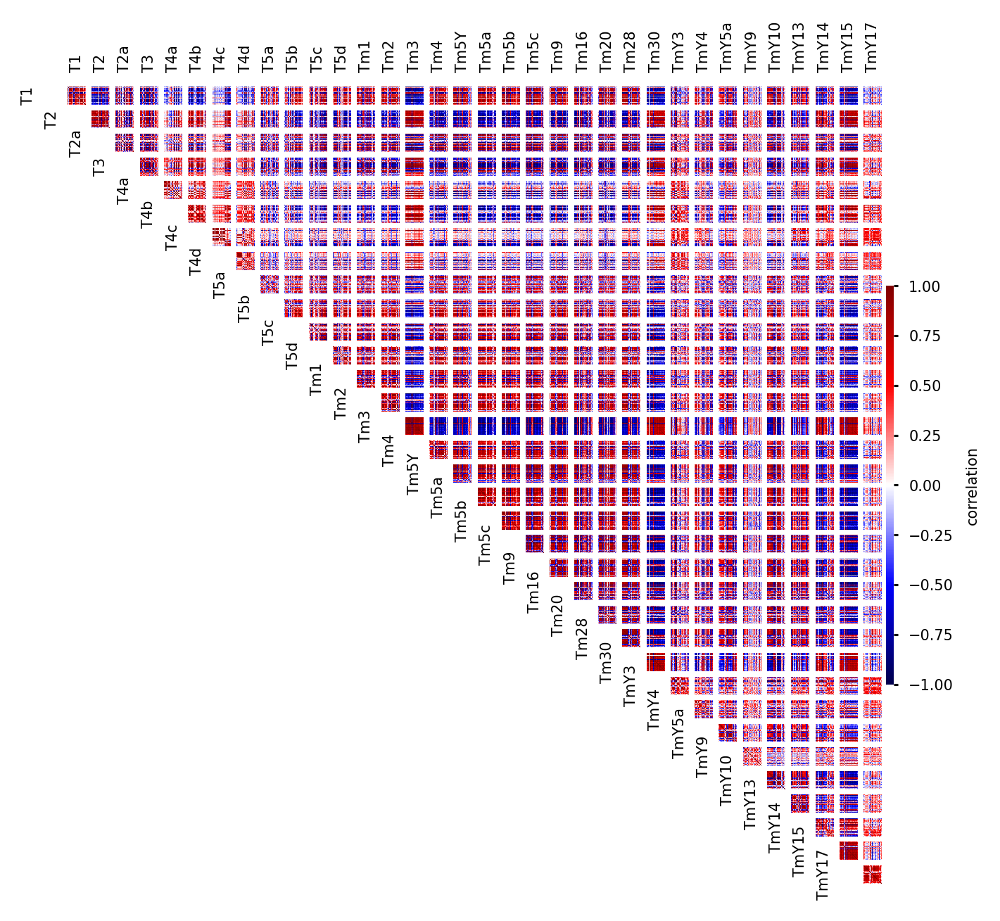

In [34]:
fig, axes = dvs.plots.divide_figure_to_grid(ax_matrix, as_matrix=True, reshape_order="special", figsize=[5, 5])

for ax in axes.flatten():
    if isinstance(ax, Axes):
        dvs.plots.rm_spines(ax)

subset_correlations = correlations[:, subset_indices][:, :, :, subset_indices]  #
vmin, vmax = -1, 1 #correlations.min().item(), correlations.max().item()

for i, row_index in enumerate(cell_indices):
    for column_index in cell_indices[i:]:
        
        axes[row_index, column_index].imshow(subset_correlations[:, row_index, :, column_index].cpu().numpy(), 
                                             cmap=plt.cm.seismic, 
                                             vmin=vmin, 
                                             vmax=vmax)
        if row_index == 0:
            axes[row_index, column_index].set_title(subset[column_index], fontsize=5, rotation=90)
        if column_index == row_index:
            axes[row_index, column_index].set_ylabel(subset[row_index], fontsize=5)

norm = dvs.plots.get_norm(vmin=vmin, vmax=vmax)
dvs.plots.add_colorbar_to_fig(plt.gcf(), cmap=plt.cm.seismic, norm=norm, width=0.01, fontsize=5, label='correlation')
# observation: R8 seems to be coupled to             

### violins of within and across cell type correlations

In [107]:
within_cell_type_corr = {}
across_cell_type_corr = {}
cell_indices = np.arange(len(ensemble.node_types))
upper_triangular_indices_wo_diagonal = np.triu_indices(len(ensemble), k=1)
upper_triangular_indices_w_diagonal = np.triu_indices(len(ensemble), k=0)

for i, cell_type in enumerate(ensemble.node_types):
    within_cell_type_corr[cell_type] = (
        correlations[:, i, :, i].cpu().numpy()[upper_triangular_indices_wo_diagonal]
    )
    across_cell_indices = np.delete(cell_indices, i)
    across_cell_type_corr[cell_type] = (
        correlations[:, i, :, across_cell_indices]
        .cpu()
        .numpy()[upper_triangular_indices_w_diagonal]
        .flatten()
    )

In [118]:
within_cell_type_corr_arr = np.stack(list(within_cell_type_corr.values()))
across_cell_type_corr_arr = np.stack(list(across_cell_type_corr.values()))

In [109]:
# substitute nan with zero
if np.isnan(across_cell_type_corr_arr).any():
    across_cell_type_corr_arr[np.isnan(across_cell_type_corr_arr)] = 0
    print("nan to zero")

In [119]:
within_cell_type_corr_arr = [sample[~np.isnan(sample)] for sample in within_cell_type_corr_arr]

In [112]:
across_cell_type_corr_arr = [sample[~np.isnan(sample)] for sample in across_cell_type_corr_arr]

In [113]:
# #groups, #random variables, #samples
corr_within_and_across = [within_cell_type_corr_arr, across_cell_type_corr_arr]

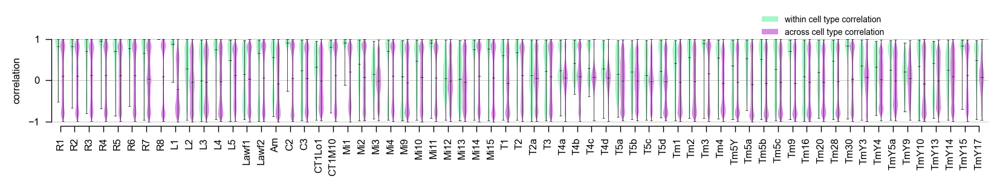

In [114]:
fig, ax, _ = dvs.plots.violin_groups_v3(corr_within_and_across,
                           xticklabels=ensemble.node_types,
                           legend=["within cell type correlation", "across cell type correlation"],
                           colors=["#50ed97", "#b118ca"],
                           scatter=False,
                           scatter_radius=2,
                           grid=True,
                           )
ax.set_xlim(dvs.plots.get_lims(ax.get_xticks(), 0.01))
ax.set_ylabel('correlation', fontsize=6)
# fig.suptitle(f"ensemble {ensemble.name} - within and across cell type correlations of naturalistic sequence responses", fontsize=6)
dvs.plots.plt_utils.trim_axis(ax)

### violins of within cell type correlation

In [120]:
known_first = True
bold_output_type_labels = True
node_types = ensemble.node_types
color_known_types = False
ylim = (-1, 1)

if known_first:
    _node_types = dvs.utils.nodes_list_sorting_on_off_unknown(node_types)
    within_cell_type_corr_arr = dvs.utils.nodes_edges_utils.sort_by_mapping_lists(
        node_types, _node_types, within_cell_type_corr_arr, axis=0
    )
    node_types = np.array(_node_types)

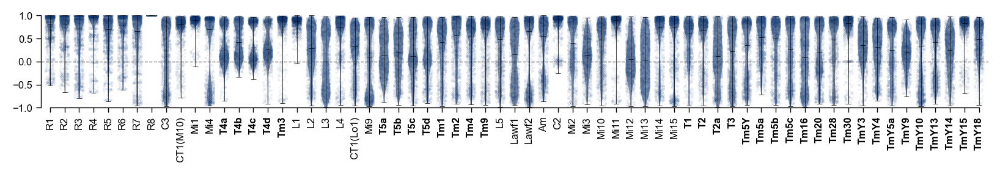

In [121]:
fig, ax, _ = dvs.plots.violin_groups_v3([within_cell_type_corr_arr],
                           xticklabels=node_types,
#                            legend=["within cell type correlation", "across cell type correlation"],
                           colors=[plt.cm.Blues(256)],
                           scatter=True,
                           scatter_radius=1,
                           grid=True,
                            scatter_alpha=0.1,
                            figsize=[10, 1],
                            fontsize=6,
                            width=0.7,
                           )



ax.grid(False)
ax.set_xlim(dvs.plots.get_lims(ax.get_xticks(), 0.01))
# ax.set_ylabel('correlation', fontsize=6)
# fig.suptitle(f"ensemble {ensemble.name} - within and across cell type correlations of naturalistic sequence responses", fontsize=6)


if bold_output_type_labels:
    dvs.plots.plt_utils.boldify_labels(ensemble.output_node_types, ax)

ax.set_ylim(*(ylim))
dvs.plots.plt_utils.trim_axis(ax)
dvs.plots.plt_utils.set_spine_tick_params(
    ax,
    tickwidth=0.5,
    ticklength=3,
    ticklabelpad=2,
    labelsize=6,
    spinewidth=0.5,
)

if color_known_types:
    ax = dvs.plots.plt_utils.flash_response_color_labels(ax)

ax.hlines(
    0,
    *ax.get_xlim(),
    linewidth=0.5,
    linestyles="dashed",
    color="0.5",
    zorder=0,
)
ax.set_yticks(np.arange(-1.0, 1.5, 0.5))

dvs.plots.plt_utils.patch_type_texts(ax)

plt.savefig(
    directory / f"within_cell_type_correlations.pdf",
    bbox_inches="tight",
    transparent=True,
)

# d - clustering of responses to naturalistic stimuli discovers performance related tuning motifs

In [25]:
fontsize = 6

In [26]:
model_mask = ensemble.best_models_mask(
    0.2, validation_subwrap=validation_subwrap, loss_name=validation_loss_fn
)

In [27]:
task_error = ensemble.task_error(
    validation_subwrap=validation_subwrap, loss_name=validation_loss_fn, normalize=False
)
colors = task_error.colors
# colors[~model_mask] = (0.53, 0.53, 0.53, 0.1)

In [28]:
cmap = task_error.cmap
norm = task_error.norm

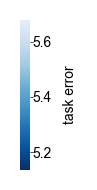

In [125]:
fig, cbar = dvs.plots.standalone_colorbar(cmap, norm, label='task error', 
                                          figsize=[0.05, 0.75], fontsize=5, 
#                                           ticks=[0.4, 0.5, 0.6, 0.7],
                                          tick_width=0.25, tick_length=1)
plt.savefig(directory / f"task_error_cbar_vertical.pdf", bbox_inches="tight", transparent=True)

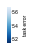

In [11]:
fig, cbar = dvs.plots.standalone_colorbar(cmap, norm, label='task error', 
                                          figsize=[0.05, 0.5], fontsize=5, 
#                                           ticks=[0.4, 0.5, 0.6, 0.7],
                                          tick_width=0.25, tick_length=1)
plt.savefig(directory / f"task_error_cbar_vertical_small.pdf", bbox_inches="tight", transparent=True)

## T4c

In [14]:
ensemble.init_movingbar(subwrap=movingedge_subwrap)

02/20/2023 06:03:51 PM - ValueError: stored spec (other) is not a value-matching superset of the initialized spec (self).
Diff is:
Namespace(
  self = ['+angles: [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]'],
  other = ['-angles']
)


In [15]:
embedding_kwargs = dict(min_dist=0.12, spread=9.0)

In [8]:
node_type = "T4c"

02/20/2023 06:02:48 PM - reshaped X from (50, 4536, 80) to (50, 362880)


/home/lappalainenj@hhmi.org/miniconda3/envs/dvs/lib/python3.10/site-packages/umap/umap_.py:1356: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


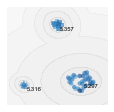

In [9]:

embeddingplot = ensemble.cluster_embedding(
    node_type,
    naturalistic_responses_wrap=naturalistic_responses_wrap,
#     color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    validation_loss_fn=validation_loss_fn,
    embedding_kwargs=embedding_kwargs,
    normalize_task_error=False,
    figsize=[1.8, 1.8],
    plot_mode=None,
    fontsize=6
)

fig = embeddingplot.fig
ax = embeddingplot.ax
fig.suptitle("")
ax.set_title("")
plt.savefig(
    directory
    / f"{node_type}_clusters_20percent_wihtout_error_normalization.pdf",
    bbox_inches="tight",
    transparent=True,
)

In [16]:
theta = ensemble[0].movingbar.angles

In [17]:
r = np.array(dvs.utils.groundtruth_utils.tuning_curves["T4c"])

In [18]:
r /= r.max()

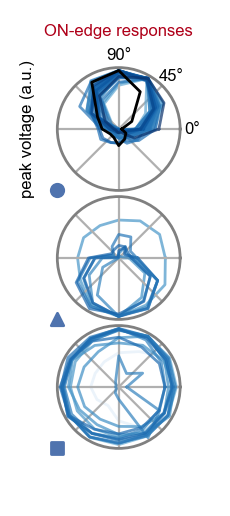

In [33]:
fig, axes = ensemble.cluster_motion_tuning(
    node_type,
    subwrap=movingedge_subwrap,
    intensity=1,
    figsize=[0.94, 2.38],
    ax_title_color="#af0019",
    colors=colors,
#     color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    fontsize=fontsize,
    loss_name=validation_loss_fn,
    naturalistic_responses_wrap=naturalistic_responses_wrap,
    embedding_kwargs=embedding_kwargs,
)
dvs.plots.polar(theta, r, fig=fig, ax=axes[0, 0], color="k", linewidth=1, fontsize=6, anglepad=-6)
axes[0, 0].set_title("ON-edge responses", fontsize=fontsize, color="#af0019", y=1.125)
axes[0, 0].set_ylabel("peak voltage (a.u.)", fontsize=fontsize, labelpad=8)

plt.savefig(
    directory / f"{node_type}_clusters_motion_tuning_20percent_with_maisak2013.pdf",
    bbox_inches="tight",
    transparent=True,
)

Text(0, 0.5, 'peak voltage (a.u.)')

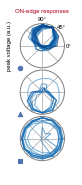

In [21]:
fig, axes = ensemble.cluster_motion_tuning(
    node_type,
    subwrap=movingedge_subwrap,
    intensity=1,
    figsize=[0.94, 2.38],
    ax_title_color="#af0019",
    colors=colors,
#     color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    fontsize=fontsize,
    loss_name=validation_loss_fn,
    naturalistic_responses_wrap=naturalistic_responses_wrap,
    embedding_kwargs=embedding_kwargs,
)
# dvs.plots.polar(theta, r, fig=fig, ax=axes[0, 0], color="k", linewidth=1, fontsize=6, anglepad=-6)
axes[0, 0].set_title("ON-edge responses", fontsize=fontsize, color="#af0019", y=1.125)
axes[0, 0].set_ylabel("peak voltage (a.u.)", fontsize=fontsize, labelpad=8)

### horizontal

In [19]:
from dvs.plots.figsize_utils import fit_panel_size

In [23]:
mpl.rcParams['figure.dpi'] = 200

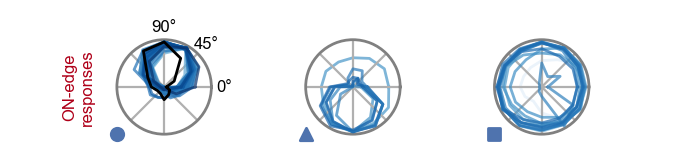

In [56]:
fig, axes = ensemble.cluster_motion_tuning(
    node_type,
    subwrap=movingedge_subwrap,
    intensity=1,
    figsize=None,
    ax_title_color="#af0019",
    colors=colors,
#     color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    fontsize=fontsize,
    loss_name=validation_loss_fn,
    naturalistic_responses_wrap=naturalistic_responses_wrap,
    embedding_kwargs=embedding_kwargs,
    horizontal=True, 
    figsizecm=[2.75, 1.5],
    wspace=0.5
)
dvs.plots.polar(theta, r, fig=fig, ax=axes[0, 0], color="k", linewidth=1, fontsize=6, anglepad=-6)
# axes[0, 0].set_title("ON-edge responses", fontsize=fontsize, color="#af0019", y=1.125)
# axes[0, 0].set_ylabel("peak voltage (a.u.)", fontsize=fontsize, labelpad=8)
axes[0, 0].set_ylabel(None, fontsize=fontsize, labelpad=8)
axes[0, 0].set_ylabel("ON-edge\nresponses", fontsize=fontsize, color=dvs.utils.color_utils.ON)

plt.savefig(
    directory / f"{node_type}_clusters_motion_tuning_20percent_with_maisak2013_horizontal.pdf",
    bbox_inches="tight",
    transparent=True,
)

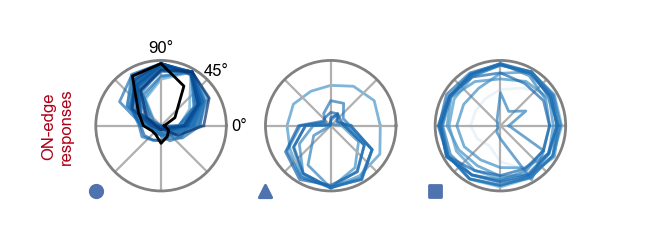

In [29]:
figsize = fit_panel_size(
    1,
    3,
    panel_width_cm=2.4,
    panel_height_cm=2.2,
    max_figure_width_cm=7.8,
    max_figure_height_cm=2.2,
    allow_rearranging=False,
)

fig, axes = figsize.axis_grid(projection="polar", as_matrix=True, wspace=0.3, hspace=0, alpha=0)

fig, axes = ensemble.cluster_motion_tuning(
    node_type,
    subwrap=movingedge_subwrap,
    intensity=1,
    figsize=None,
    ax_title_color="#af0019",
    colors=colors,
#     color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    fontsize=fontsize,
    loss_name=validation_loss_fn,
    naturalistic_responses_wrap=naturalistic_responses_wrap,
    embedding_kwargs=embedding_kwargs,
    horizontal=True, 
    figsizecm=[2.75, 1.5],
    wspace=0.5,
    fig=fig,
    axes=axes
)
dvs.plots.polar(theta, r, fig=fig, ax=axes[0, 0], color="k", linewidth=1, fontsize=6, anglepad=-6)
# axes[0, 0].set_title("ON-edge responses", fontsize=fontsize, color="#af0019", y=1.125)
# axes[0, 0].set_ylabel("peak voltage (a.u.)", fontsize=fontsize, labelpad=8)
axes[0, 0].set_ylabel(None, fontsize=fontsize, labelpad=8)
axes[0, 0].set_ylabel("ON-edge\nresponses", fontsize=fontsize, color=dvs.utils.color_utils.ON)

plt.savefig(
    directory / f"{node_type}_clusters_motion_tuning_20percent_with_maisak2013_horizontal_v2.pdf",
    bbox_inches="tight",
    transparent=True,
)

# e - T4c inputs

In [58]:
nnv = ensemble[0]

In [10]:
mpl.rcParams['figure.dpi'] = 200


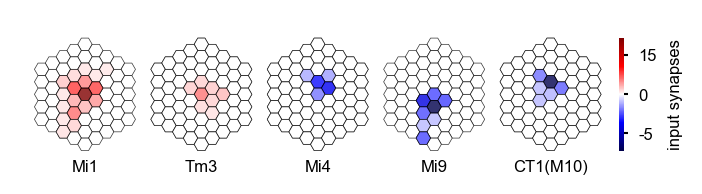

In [64]:
u = [0, 1, 2, 3, 4]
v = [0, 0, 0, 0, 0]

u_ax_title = 0 #-3.5
v_ax_title = 3.5 #-3.5
x_ax_title, y_ax_title = dvs.utils.hex_to_pixel(u_ax_title, v_ax_title)

x_ax_title = 0
y_ax_title = - 10

x, y = dvs.utils.hex_to_pixel(u, v, mode="pointy")
x += 0.1
y += 0.1

fig, axes, pos = dvs.plots.regular_ax_scatter(
    x,
    y,
    figsize=[3.65, 1],
    hpad=0,
    wpad=0.0,
    wspace=-1.75,
    hspace=-0.5,
)
sources = ["Mi1", "Tm3", "Mi4", "Mi9", "CT1M10"]
fig, axes, (vmin, vmax) = nnv.receptive_fields_grid(
    "T4c",
    sources=sources,
    sort_alphabetically=False,
    fontsize=6,
    cbar=False,
    max_extent=4,
    ax_titles="",
    fig=fig,
    axes=axes,
    annotate=False,
    edgewidth=0.25,
)
for i, source_type in enumerate(sources):
    if source_type == "CT1M10":
        source_type = "CT1(M10)"
    axes[i].annotate(
        source_type,
        (x_ax_title, y_ax_title),
        xycoords="data",
        ha="center",
        va="center",
        fontsize=6,
    )

cmap = plt.cm.seismic
norm = dvs.plots.plt_utils.get_norm(vmin=vmin, vmax=21.2, midpoint=0)
dvs.plots.plt_utils.add_colorbar_to_fig(
    fig,
    width=0.01,
    height=0.75,
    fontsize=6,
    cmap=cmap,
    norm=norm,
    label="input synapses",
    ticks=[-5, 0, 15],
    n_decimals=0
)
plt.savefig(directory / f"anatomical_inputs.pdf", bbox_inches="tight", transparent=True)

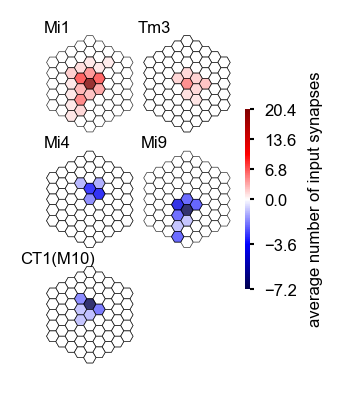

In [174]:
u = [0, 1, 2, 3, 4]
v = [0, 0, 0, 0, 0]

u_ax_title = -3.5
v_ax_title = -3.5
x_ax_title, y_ax_title = dvs.utils.hex_to_pixel(u_ax_title, v_ax_title)

x, y = dvs.utils.hex_to_pixel(u, v, mode="pointy")
x += 0.1
y += 0.1

x = [1.1, 0.1, 1.1, 0.1, 1.1]
y = [3.1, 3.1, 2.1, 2.1, 1.1]


# fig, axes, pos = dvs.plots.regular_ax_scatter(
#     x,
#     y,
#     figsize=[1.88, 2.38],
#     hpad=0,
#     wpad=0.0,
# #     wspace=-3,
# #     hspace=-0.5,
# )



sources = ["Mi1", "Tm3", "Mi4", "Mi9", "CT1M10"]

fig, axes = dvs.plots.divide_figure_to_grid(matrix=[[0, 1], [2, 3], [4, np.nan]],
                                           wspace=-0.5,
                                            hspace=-0.1,
                                           figsize=[1.88, 2.38])


fig, axes, (vmin, vmax) = nnv.receptive_fields_grid(
    "T4c",
    sources=sources,
    sort_alphabetically=False,
    fontsize=6,
    cbar=False,
    max_extent=4,
    ax_titles="",
    fig=fig,
    axes=axes,
    annotate=False,
    edgewidth=0.25
)
for i, source_type in enumerate(sources):
    if source_type == "CT1M10":
        source_type = "CT1(M10)"
    axes[i].annotate(
        source_type,
        (x_ax_title, y_ax_title),
        xycoords="data",
        ha="center",
        va="center",
        fontsize=6,
    )

cmap = plt.cm.seismic
norm = dvs.plots.plt_utils.get_norm(vmin=vmin, vmax=vmax, midpoint=0)
dvs.plots.plt_utils.add_colorbar_to_fig(
    fig,
    width=0.025,
    height=0.5,
    fontsize=6,
    cmap=cmap,
    norm=norm,
    label="average number of input synapses",
)
plt.savefig(directory / f"anatomical_inputs_vertical.pdf", bbox_inches="tight", transparent=True)

# dsi per cluster

In [45]:
def cluster_node_type_dsi(ensemble, node_type, cluster_indices, intensity, subwrap = movingedge_subwrap):
    
    all_dsis = []
    for cluster, indices in cluster_indices.items():
        with ensemble.model_items(indices):
            dsis, node_types = ensemble.dsis(subwrap, intensity)
        all_dsis.append(dsis[:, node_types == node_type])
        
    return np.array(all_dsis)

In [46]:
cluster_indices = ensemble.cluster_indices("T4c", 
                                           validation_subwrap=validation_subwrap, 
                                           loss_name=validation_loss_fn,
                                           naturalistic_responses_wrap=naturalistic_responses_wrap,
                                           embedding_kwargs=embedding_kwargs)

In [47]:
dsis_on = cluster_node_type_dsi(ensemble, node_type, cluster_indices, 1)

<ipython-input-45-21dc312a64e4>:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(all_dsis)


In [48]:
dsis_off = cluster_node_type_dsi(ensemble, node_type, cluster_indices, 0)

<ipython-input-45-21dc312a64e4>:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(all_dsis)


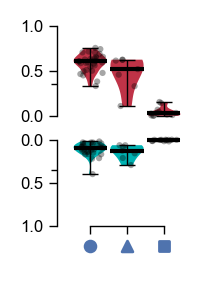

In [52]:
fig = plt.figure(figsize=[0.7, 1.0])
ax1 = fig.add_axes([0, 0.525, 1, 0.475])
dvs.plots.plt_utils.rm_spines(ax1, spines=("bottom",))
ax2 = fig.add_axes([0, 0, 1, 0.475])

scatter_edge_width = 1
scatter_edge_color = "none"
scatter_face_color = "k"
scatter_alpha = 0.35
scatter_all_marker = "o"


dvs.plots.violin_groups(
    np.array(dsis_on)[:, None],
    #                          figsize=[0.7, 1],
    fontsize=6,
    width=0.9,
    scatter=False,
    colors=(dvs.utils.color_utils.ON,),
    scatter_radius=0.2,
    violin_alpha=0.8,
    fig=fig,
    ax=ax1,
    mean_median_linewidth=1.5,
    mean_median_color="k",  # "#FF7276", #"white",
    mean_median_bar_length=1.0,
)


ax1.grid(False)

uniform=[-0.35, 0.35]
markers = dvs.analysis.clustering.MARKERS
for i, _dsis in enumerate(dsis_on):
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
    ax1.scatter(
        np.ones(len(_dsis.flatten())) * i + np.random.uniform(*uniform, size=len(_dsis.flatten())),
        _dsis.flatten(),
        s=5,
        marker=scatter_all_marker,
        facecolor=scatter_face_color,
        edgecolor=scatter_edge_color,
        alpha=scatter_alpha,
        zorder=100,
    )

dvs.plots.violin_groups(
    np.array(dsis_off)[:, None],
    #                          figsize=[0.7, 1],
    fontsize=6,
    width=0.9,
    scatter=False,
    colors=(dvs.utils.color_utils.OFF,),
    scatter_radius=0.2,
    violin_alpha=1.0,
    fig=fig,
    ax=ax2,
    mean_median_linewidth=1.5,
    mean_median_color="k",  # "#FF7276", #"white",
    mean_median_bar_length=1.0,
)

markers = dvs.analysis.clustering.MARKERS
for i, _dsis in enumerate(dsis_off):
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
    ax2.scatter(
        np.ones(len(_dsis.flatten())) * i + np.random.uniform(*uniform, size=len(_dsis.flatten())),
        _dsis.flatten(),
        s=5,
        marker=scatter_all_marker,
        facecolor=scatter_face_color,
        edgecolor=scatter_edge_color,
        alpha=scatter_alpha,
        zorder=100,
    )

ax1.set_ylim(-0.05, 1.0)
ax2.set_ylim(-0.1, 1.0)


# ax1.set_xticks([])
ax2.set_xticks(list(range(len(cluster_indices))))

plots.plt_utils.trim_axis(ax1)
plots.plt_utils.trim_axis(ax2)

ax2.invert_yaxis()
# ax2.set_xticks([])
# ax2.set_xticks([0, 1, 2, 3], minor=True)


def add_cluster_marker(fig, ax, marker="o", marker_size=15, color="#4F73AE"):

    overlay_ax = [ax for ax in fig.axes if ax.get_label() == "overlay"]
    overlay_ax = (
        overlay_ax[0] if overlay_ax else fig.add_axes([0, 0, 1, 1], label="overlay")
    )
    overlay_ax.set_ylim(0, 1)
    overlay_ax.set_xlim(0, 1)
    left, bottom, width, height = ax.get_position().bounds

    overlay_ax.patch.set_alpha(0)
    dvs.plots.plt_utils.rm_spines(
        overlay_ax, visible=False, rm_xticks=True, rm_yticks=True
    )
    overlay_ax.scatter(left, bottom, marker=marker, s=marker_size, color=color)


tick_data_coords = np.vstack((ax2.get_xticks(minor=False), np.ones_like(ax2.get_xticks(minor=False)))).T
# from data to Figure coordinates - from figure coordinates to ax-relative coordinates
# tick_positions = ax2.transAxes.inverted().transform(ax2.transData.transform(crd))[:,0]
left, bottom, width, height = ax2.get_position().bounds
overlay_ax = fig.add_axes([left, bottom - 0.175, width, 0.15])
dvs.plots.rm_spines(overlay_ax)
overlay_ax.set_xlim(ax2.get_xlim())
overlay_ax.patch.set_alpha(0)

for cluster_id in cluster_indices:
    x, y = tick_data_coords[cluster_id]
    overlay_ax.scatter(x, y, marker=markers[cluster_id], s=15, color="#4F73AE")

ax2.set_xticklabels([" " for xticks in ax2.get_xticks()])

yticks = [0, 0.3569298612537902, 0.5, 1]
yticklabels = ["0.0", "", "0.5", "1.0"]
yticks = [0, 0.5, 1]
yticklabels = ["0.0", "0.5", "1.0"]
ax1.set_yticks(yticks, yticklabels)
ax1.set_yticks([0.3569298612537902], minor=True)
ax2.set_yticks(yticks, yticklabels)
ax2.set_yticks([0.3569298612537902], minor=True)

dvs.plots.plt_utils.set_spine_tick_params(
    ax1,
    tickwidth=0.5,
    ticklength=3,
    ticklabelpad=2,
    labelsize=6,
    spinewidth=0.5,
)

dvs.plots.plt_utils.set_spine_tick_params(
    ax2,
    tickwidth=0.5,
    ticklength=3,
    ticklabelpad=2,
    labelsize=6,
    spinewidth=0.5,
)

plt.savefig(
    directory / f"T4c_direction_selectivity_per_cluster.pdf",
    bbox_inches="tight",
    transparent=True,
)

# f - preferred contrasts of T4c inputs per cluster

In [33]:
cluster_indices = ensemble.cluster_indices(
    "T4c",
    naturalistic_responses_wrap=naturalistic_responses_wrap,
#     color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    loss_name=validation_loss_fn,
    embedding_kwargs=embedding_kwargs,
)

In [34]:
on_pathway = dvs.utils.nodes_edges_utils.nodes_list_sorting_on_off_unknown()

In [35]:
on_pathway = ["Mi1", "Tm3", "Mi4", "Mi9", "CT1M10"] #[*[f"R{i}" for i in range(1, 9)], *dvs.utils.groundtruth_utils.on_pathway]

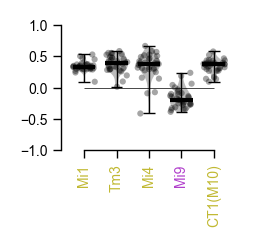

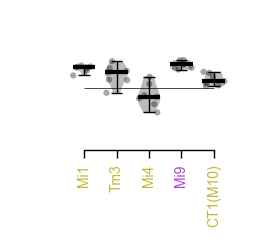

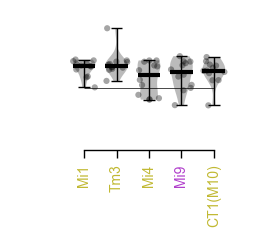

In [47]:
for i, indices in enumerate(cluster_indices.values()):
    with ensemble.model_items(key=indices):
        #         ensemble.plot_parameter_marginals(
        #             "nodes_time_const",
        #             max_per_ax=100,
        #             best_ratio=1,
        #             worst_ratio=1,
        #             initialization=True,
        #         )
        #         plt.show()
        fig, ax = ensemble.fris_paper_figure(
            sorted_type_list=on_pathway,
            cmap=plt.cm.Greys_r,
            cstart=100,
            known_first=False,
            figsize=[1.13, 0.83],
            subwrap=flash_subwrap,
            validation_subwrap=validation_subwrap,
            bold_output_type_labels=False,
            color_known_types=True,
            scatter_best=False,
            fontsize=5,
            scatter_edge_width=1,
            scatter_best_edge_width=0.75,
            scatter_edge_color="none",
            scatter_face_color="k",
            scatter_alpha=0.35,
            scatter_best_alpha=1.0,
            scatter_all_marker="o",
            scatter_best_marker="o",
            scatter_best_color=None,
            mean_median_linewidth=1.5,
            mean_median_color="k",  # "#FF7276", #"white",
            mean_median_bar_length=1.0,
        )
        if i > 0:
#             dvs.plots.rm_spines(ax, spines=("left",))
            ax.spines['left'].set_color('none')
#             ax.spines['top'].set_color('red')
            ax.yaxis.label.set_color('none')
            ax.tick_params(axis='y', colors='none')
        #         dvs.plots.plt_utils.boldify_labels(["Mi4", "Mi9"], ax)
        plt.savefig(
            directory
            / f"cluster_{i}_fris.pdf",
            bbox_inches="tight",
            transparent=True,
        )
        plt.show()